In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pydicom
import seaborn as sns

from fastprogress import master_bar, progress_bar
from glob import glob
from IPython import display
from matplotlib import animation

# tabular

In [2]:
base_dir  = './input/osic-pulmonary-fibrosis-progression/'

In [3]:
train_df = pd.read_csv(base_dir + 'train.csv')

train_df.sample(10)

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
945,ID00242637202264759739921,41,1644,48.570078,64,Male,Ex-smoker
1192,ID00331637202286306023714,55,3232,97.572757,69,Male,Currently smokes
1494,ID00414637202310318891556,63,1612,42.849548,65,Male,Never smoked
312,ID00089637202204675567570,31,2076,48.563675,63,Male,Never smoked
1090,ID00298637202280361773446,6,1792,102.564103,67,Female,Never smoked
575,ID00138637202231603868088,30,4196,101.372246,66,Male,Ex-smoker
1366,ID00376637202297677828573,48,4320,120.670391,72,Male,Never smoked
60,ID00015637202177877247924,52,2682,69.338159,71,Male,Ex-smoker
651,ID00169637202238024117706,53,2471,104.376109,66,Female,Never smoked
910,ID00234637202261078001846,41,1897,52.391737,66,Male,Ex-smoker


In [4]:
patient = train_df[train_df.Patient == 'ID00202637202249376026949']
patient

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
759,ID00202637202249376026949,20,4311,107.281505,64,Male,Never smoked
760,ID00202637202249376026949,21,4279,106.485168,64,Male,Never smoked
761,ID00202637202249376026949,23,4316,107.405933,64,Male,Never smoked
762,ID00202637202249376026949,25,4185,104.145929,64,Male,Never smoked
763,ID00202637202249376026949,27,4029,100.263787,64,Male,Never smoked
764,ID00202637202249376026949,33,4092,101.831575,64,Male,Never smoked
765,ID00202637202249376026949,45,4040,100.537527,64,Male,Never smoked
766,ID00202637202249376026949,58,3641,90.608202,64,Male,Never smoked
767,ID00202637202249376026949,75,3646,90.732630,64,Male,Never smoked


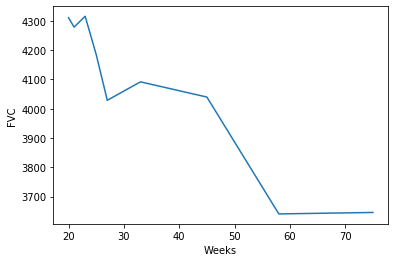

In [5]:
sns.lineplot(data=patient, x='Weeks', y='FVC')

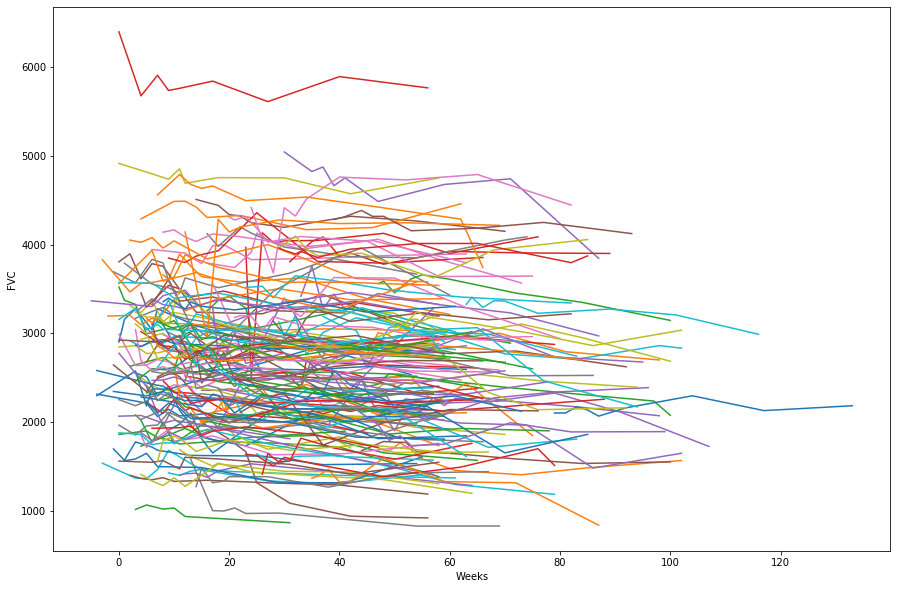

In [9]:
plt.figure(figsize=(15, 10))
for patient in train_df.Patient.unique():
    patient = train_df[train_df.Patient == patient]
    sns.lineplot(data=patient, x='Weeks', y='FVC')

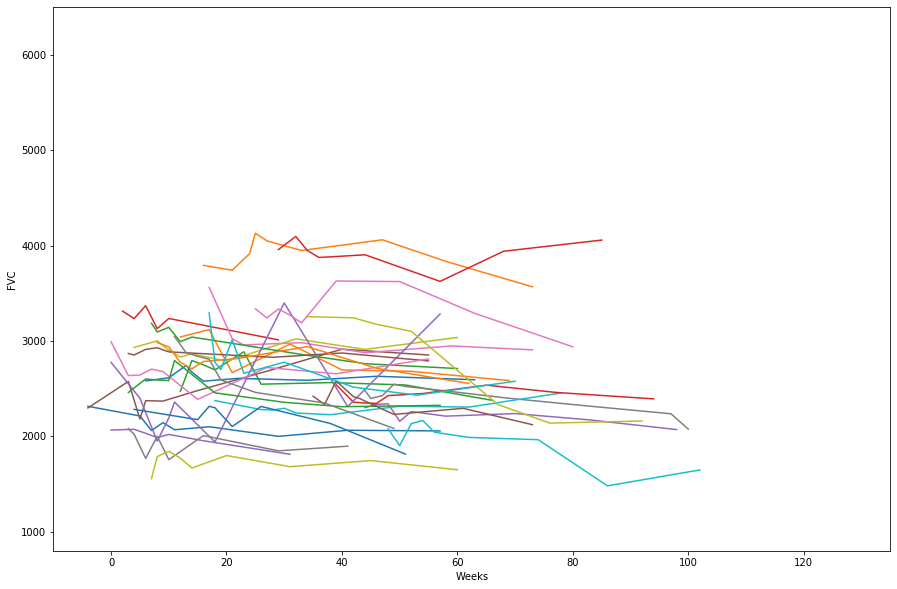

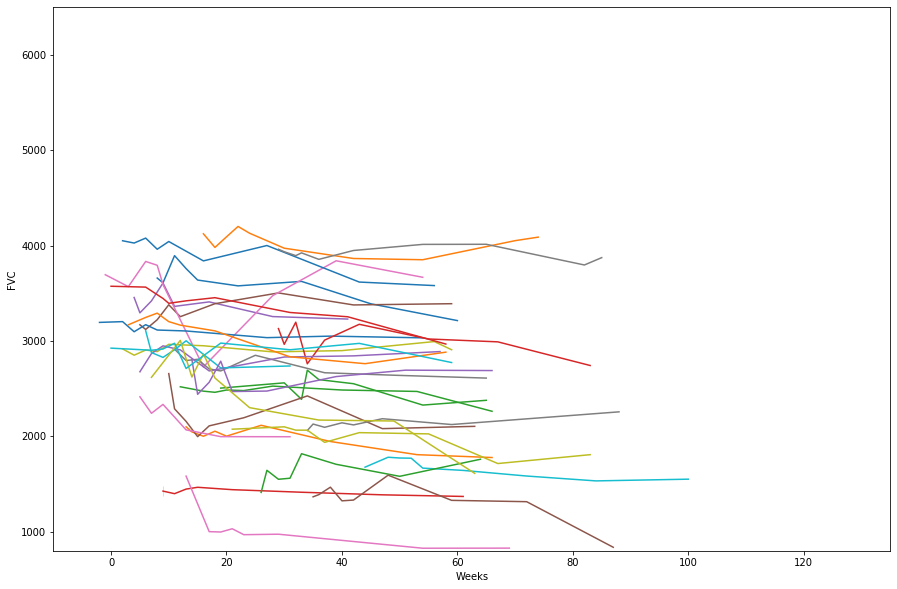

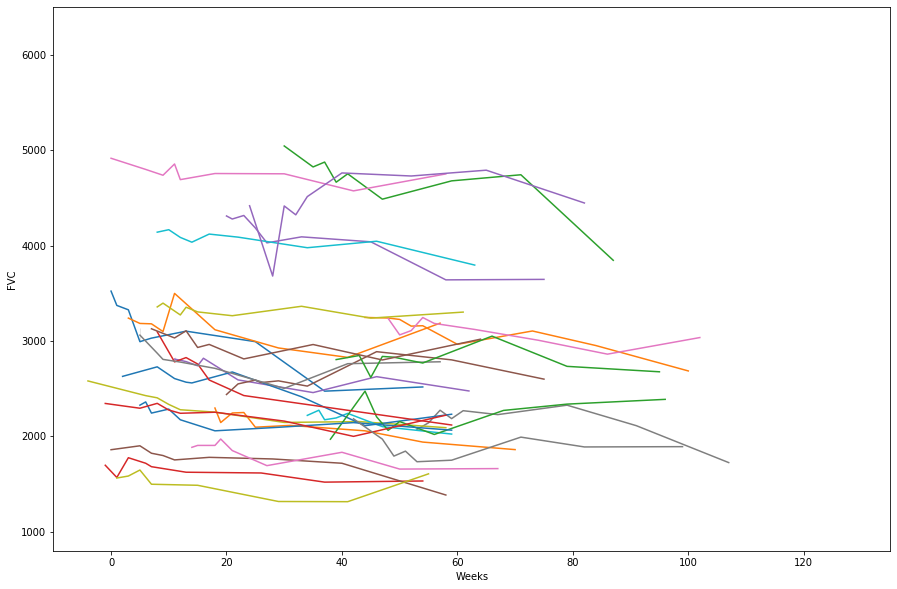

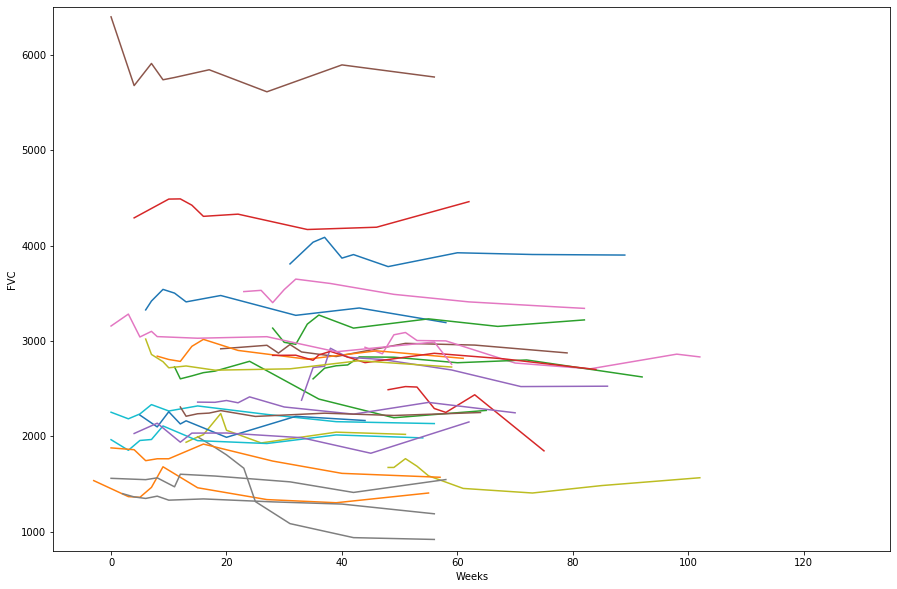

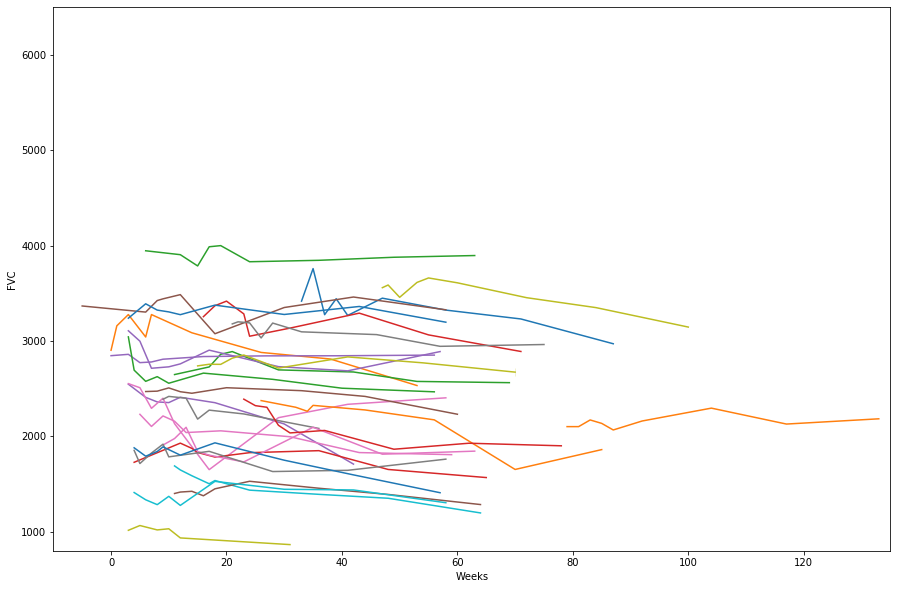

In [17]:
for i in range(5):
    plt.figure(figsize=(15, 10))
    plt.ylim((800, 6500))
    plt.xlim((-10, 135))
    for patient in train_df.Patient.unique()[i::6]:
        patient = train_df[train_df.Patient == patient]
        sns.lineplot(data=patient, x='Weeks', y='FVC')
    plt.show()

In [6]:
train_df.shape, train_df.Patient.nunique()

((1549, 7), 176)

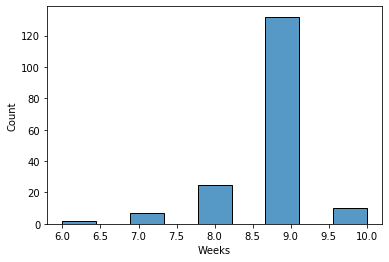

In [7]:
sns.histplot(train_df.groupby('Patient').Weeks.agg('count'))

In [8]:
train_df.groupby( ['Sex','Age'] )['FVC'].agg( ['mean','std','count'] )

mean          std  count
Sex    Age                                 
Female 49   2915.333333    49.527770      9
       52   1501.333333   160.199875      9
       55   1709.000000   130.055192     18
       56   1782.777778   114.376328      9
       57   1328.000000   204.937185      9
       58   1818.111111   117.547272      9
       61   1455.722222   108.010787     18
       62   1731.058824   287.478797     17
       63   2201.875000   165.148797      8
       64   3096.333333   121.471190      9
       65   2421.000000   975.452957     18
       66   2246.277778   654.237948     36
       67   1765.888889   165.907689      9
       68   2153.526316   656.154485     19
       69   1588.555556   121.787839      9
       70   1247.066667   225.112501     15
       71   1401.166667   101.814855     18
       72   1761.888889   116.012332      9
       73   1637.111111    87.646227      9
       74   1897.777778   131.183551     18
       76   1703.000000   325.595992     17
       77   1026.250000   237.996849      8
       79   2209.444444   173.192170      9
       83   1983.555556   120.008449      9
       87   2175.428571    86.251294      7
Male   51   2525.555556   251.121540      9
       52   2999.111111   162.528801      9
       53   3033.400000   142.357297     10
       54   2231.500000   186.242494     16
       55   3922.000000    68.546821     10
       56   3071.588235   506.215616     34
       57   2899.052632    80.976316     19
       58   3199.188679  1006.635926     53
       59   2498.000000   159.385539      9
       60   2729.266667   588.849703     45
       61   3272.888889   125.031440      9
       62   2722.588235   320.566271     34
       63   3166.644444   835.146344     45
       64   3116.262500   913.740701     80
       65   2923.026087   831.666004    115
       66   2962.204545   893.283011     44
       67   2750.055556   593.763346     36
       68   3040.915493   515.215260     71
       69   3088.767857   627.614402    112
       70   3130.250000   591.714777     44
       71   3111.950000  1131.693610     80
       72   3208.914286   815.236051     70
       73   2644.505618   359.881676     89
       74   2195.843137   419.673129     51
       75   2213.529412   119.382326     17
       76   3360.555556   562.588265     18
       77   2280.652174   543.232213     23
       78   2353.555556   243.148156     27
       79   2474.666667   390.353535     18
       81   2615.777778   140.079243      9
       83   3111.666667    65.977269      9
       88   1981.111111   134.684302      9

In [9]:
# age and smokingstatus haven't change at training set
gb = train_df.groupby('Patient')
for ID, df in gb:
    smokingstatus = df.SmokingStatus
    age = df.Age
    assert all(smokingstatus[smokingstatus.keys()[0]] == smokingstatus), ID
    assert all(age[age.keys()[0]] == age), ID

In [10]:
test_df = pd.read_csv(base_dir + 'test.csv')
test_df

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00419637202311204720264,6,3020,70.186855,73,Male,Ex-smoker
1,ID00421637202311550012437,15,2739,82.045291,68,Male,Ex-smoker
2,ID00422637202311677017371,6,1930,76.672493,73,Male,Ex-smoker
3,ID00423637202312137826377,17,3294,79.258903,72,Male,Ex-smoker
4,ID00426637202313170790466,0,2925,71.824968,73,Male,Never smoked


In [11]:
sub_df = pd.read_csv(base_dir + 'sample_submission.csv')
sub_df['Patient'] = sub_df.Patient_Week.apply(lambda x: x.split('_')[0])
sub_df['target_week'] = sub_df.Patient_Week.apply(lambda x: x.split('_')[1])
sub_df.sample(10)

,Patient_Week,FVC,Confidence,Patient,target_week
623,ID00423637202312137826377_112,2000,100,ID00423637202312137826377,112
609,ID00426637202313170790466_109,2000,100,ID00426637202313170790466,109
594,ID00426637202313170790466_106,2000,100,ID00426637202313170790466,106
86,ID00421637202311550012437_5,2000,100,ID00421637202311550012437,5
210,ID00419637202311204720264_30,2000,100,ID00419637202311204720264,30
361,ID00421637202311550012437_60,2000,100,ID00421637202311550012437,60
320,ID00419637202311204720264_52,2000,100,ID00419637202311204720264,52
170,ID00419637202311204720264_22,2000,100,ID00419637202311204720264,22
148,ID00423637202312137826377_17,2000,100,ID00423637202312137826377,17
120,ID00419637202311204720264_12,2000,100,ID00419637202311204720264,12


In [12]:
sub_df.shape, sub_df.Patient.nunique(), sub_df.target_week.nunique(), 

((730, 5), 5, 146)

In [13]:
# taget week would be same as baseweek
sub_df[sub_df.Patient_Week == 'ID00419637202311204720264_6']

,Patient_Week,FVC,Confidence,Patient,target_week
90,ID00419637202311204720264_6,2000,100,ID00419637202311204720264,6


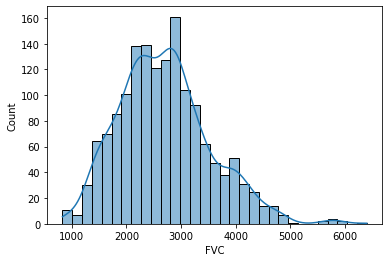

In [14]:
sns.histplot(x=train_df.FVC, kde=True)

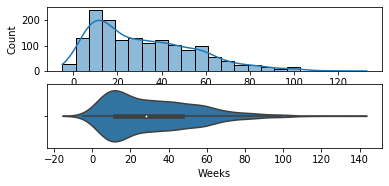

In [15]:
plt.subplot(311)
sns.histplot(x=train_df.Weeks, kde=True)
plt.subplot(312)
sns.violinplot(x=train_df.Weeks)

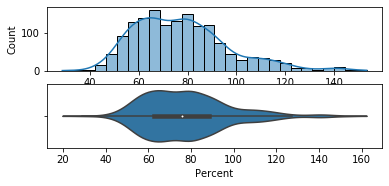

In [16]:
plt.subplot(311)
sns.histplot(x=train_df.Percent, kde=True)
plt.subplot(312)
sns.violinplot(x=train_df.Percent)

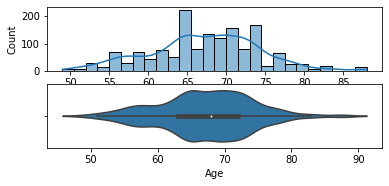

In [17]:
plt.subplot(311)
sns.histplot(x=train_df.Age, kde=True)
plt.subplot(312)
sns.violinplot(x=train_df.Age)

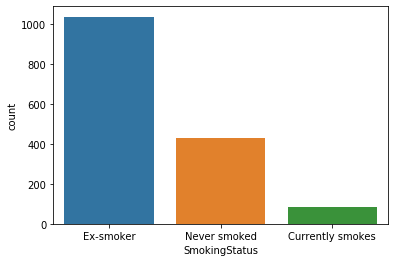

In [18]:
sns.countplot(x=train_df.SmokingStatus)

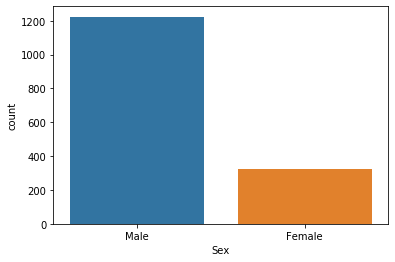

In [19]:
sns.countplot(x=train_df.Sex)

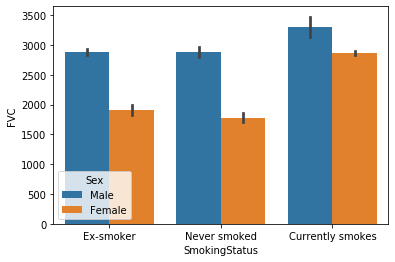

In [20]:
sns.barplot(x=train_df.SmokingStatus, y=train_df.FVC, hue=train_df.Sex)

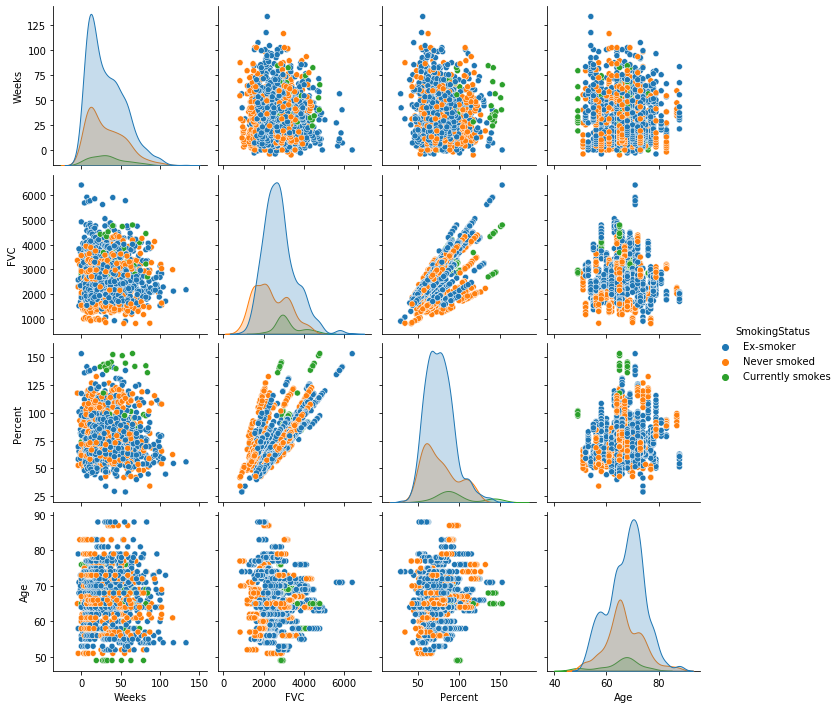

In [21]:
sns.pairplot(train_df, hue='SmokingStatus')

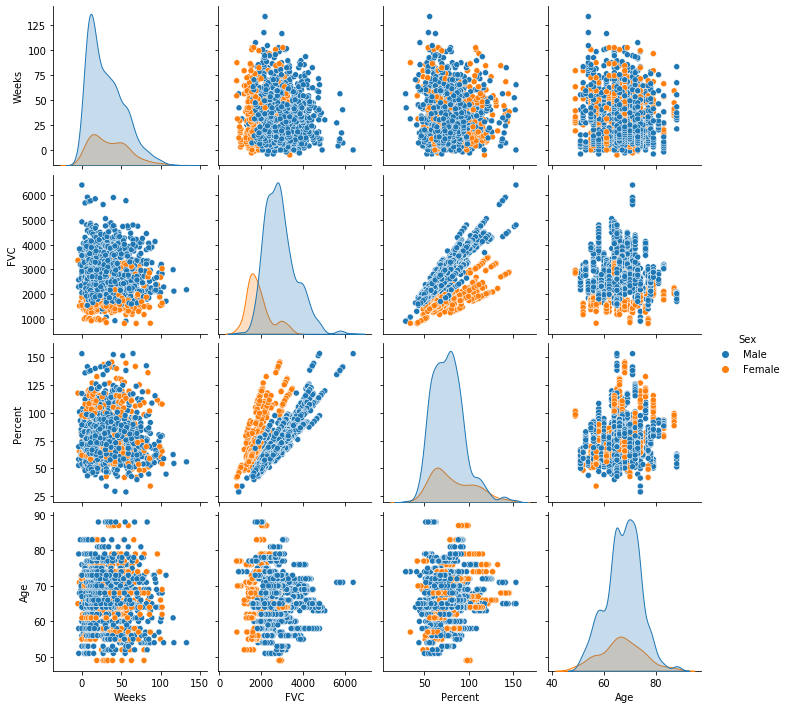

In [22]:
sns.pairplot(train_df, hue='Sex')

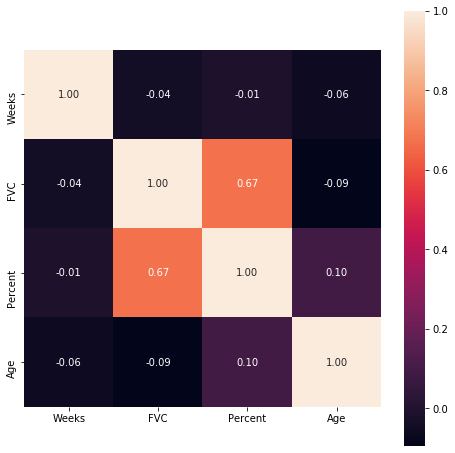

In [23]:
fig = plt.figure(figsize=(8, 8))
sns.heatmap(train_df[['Weeks', 'FVC', 'Percent', 'Age']].corr(), annot=True, square=True, fmt='.2f')   

# new feature

In [25]:
train_df['percent_reciprocal'] = 1 / train_df.Percent
train_df['percent_ratio'] = train_df.FVC / train_df.Percent

def calculate_height(row):
    height = 0
    if row['Sex'] == 'Male' or 'Female':
        height = (((row['FVC'] / 933.33) + 0.026 * row['Age'] + 2.89) /
                  0.0443)
        return int(height)


train_df['Height'] = train_df.apply(calculate_height, axis=1)


def FEV1(row):
    FEV = 0
    if row['Sex'] == 'Male':
        FEV = (0.84 * row['FVC'] - 0.23)
    else:
        FEV = (0.84 * row['FVC'] - 0.36)
    return FEV


train_df['FEV'] = train_df.apply(FEV1, axis=1)
train_df['FEV_ratio'] = train_df.FEV / train_df.FVC
train_df

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus,percent_reciprocal,percent_ratio,Height,FEV,FEV_ratio
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker,0.017166,39.740,167,1944.37,0.839901
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker,0.017949,39.740,165,1859.53,0.839896
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker,0.019282,39.740,161,1731.01,0.839888
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker,0.018535,39.740,163,1800.73,0.839893
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker,0.019207,39.740,161,1737.73,0.839889
...,...,...,...,...,...,...,...,...,...,...,...,...
1544,ID00426637202313170790466,13,2712,66.594637,73,Male,Never smoked,0.015016,40.724,173,2277.85,0.839915
1545,ID00426637202313170790466,19,2978,73.126412,73,Male,Never smoked,0.013675,40.724,180,2501.29,0.839923
1546,ID00426637202313170790466,31,2908,71.407524,73,Male,Never smoked,0.014004,40.724,178,2442.49,0.839921
1547,ID00426637202313170790466,43,2975,73.052745,73,Male,Never smoked,0.013689,40.724,180,2498.77,0.839923


C:\Users\utl\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


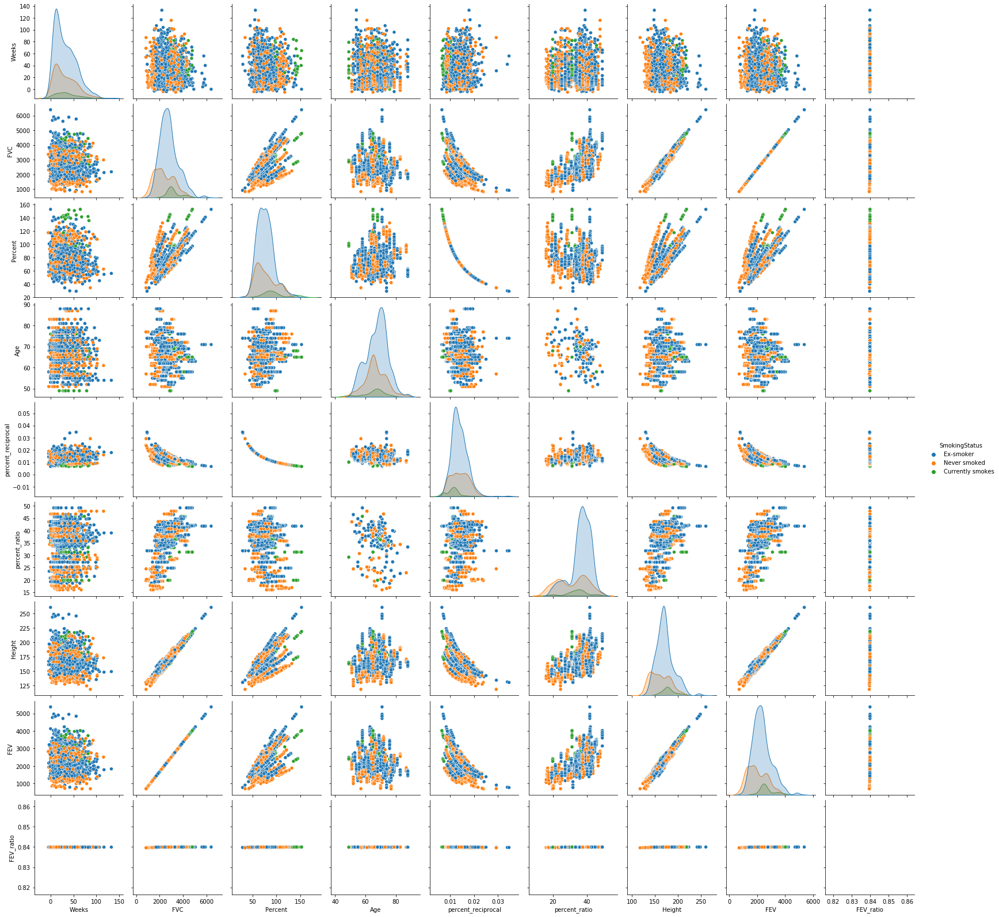

In [26]:
sns.pairplot(train_df, hue='SmokingStatus')

C:\Users\utl\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


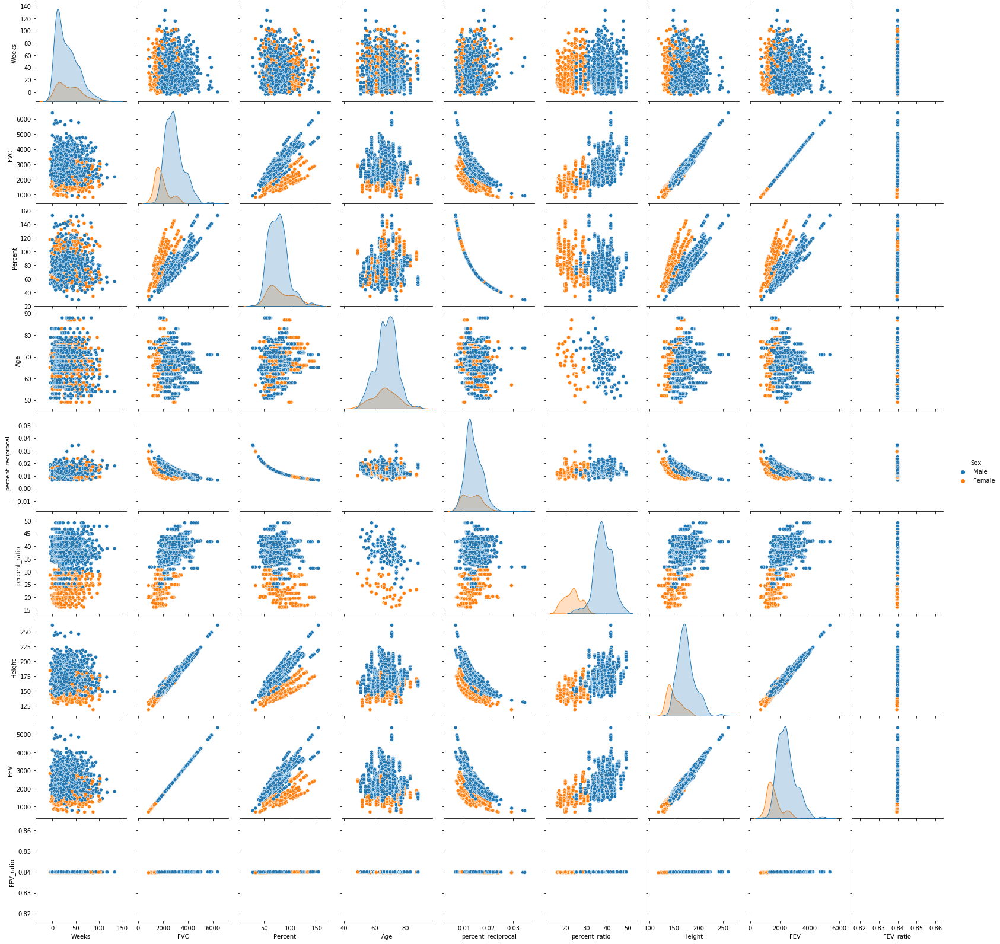

In [27]:
sns.pairplot(train_df, hue='Sex')

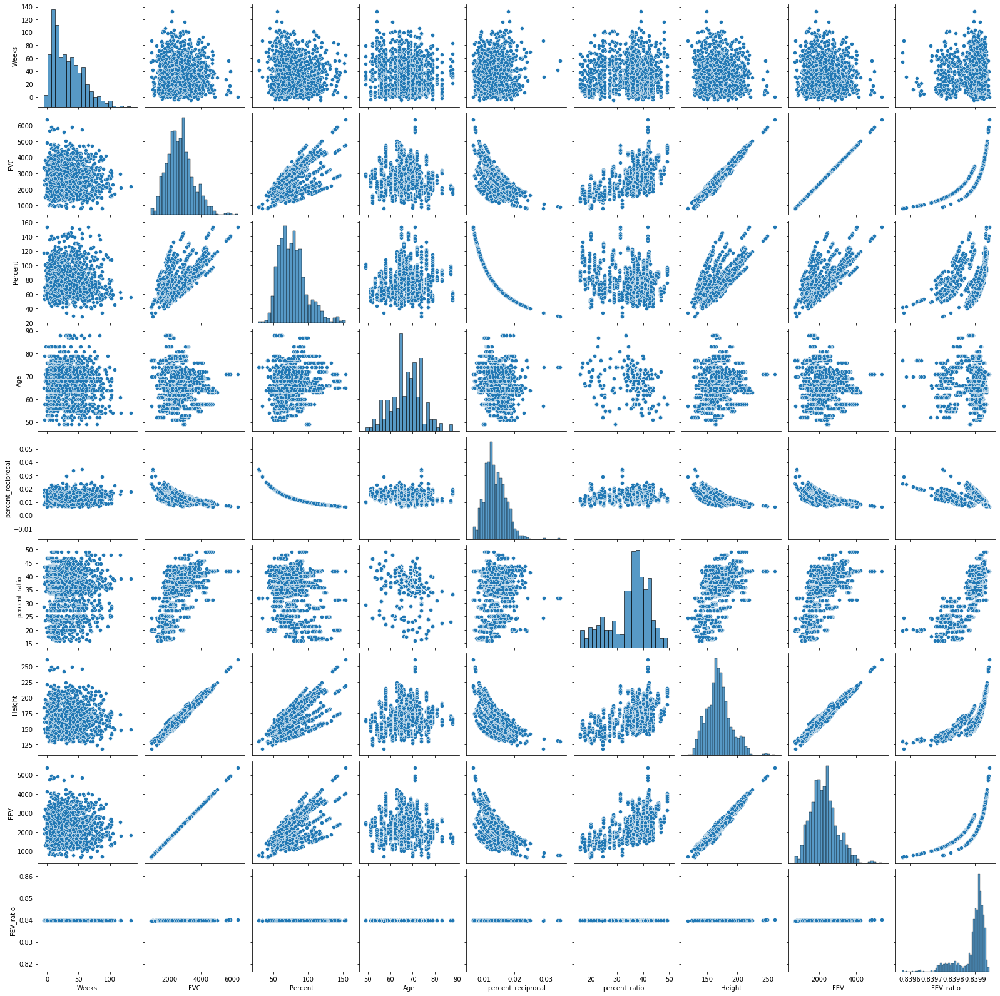

In [28]:
sns.pairplot(train_df)

# loss

In [ ]:
# https://www.kaggle.com/rohanrao/osic-understanding-laplace-log-likelihood#ML-Prediction
def laplace_log_likelihood(preds, ys, confidence, mean=True):
    std_clip = np.maximum(confidence, 70)
    delta = np.minimum(np.abs(preds - ys), 1000)
    metric = -2**0.5 * delta / std_clip - np.log(2 ** 0.5 * std_clip)
    
    if mean: return metric.mean()
    return metric

# preds, ys相差越小(越準)時，confidence(std)就要越小
# 反之

# baseline
laplace_log_likelihood(np.mean(train_df.FVC), train_df.FVC, np.std(train_df.FVC))

# dicom

In [ ]:
BAD_ID = ['ID00011637202177653955184', 'ID00052637202186188008618']

In [20]:
pydicom.read_file(base_dir + 'train/ID00007637202177411956430/1.dcm')

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 200
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 2.25.12297650151329871895440507938349160734
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.1
(0002, 0013) Implementation Version Name         SH: 'OSIRIX_361'
(0002, 0016) Source Application Entity Title     AE: 'ANONYMOUS'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008, 0018) SOP Instance UID                    UI: 2.25.12297650151329871895440507938349160734
(0008, 0060) Modality                            CS: 'CT'
(0008, 0070) 

In [32]:
pydicom.read_file(base_dir + 'train/ID00009637202177434476278/1.dcm')

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 206
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.0.37492.1591423150.182195
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.1
(0002, 0013) Implementation Version Name         SH: 'OSIRIX_361'
(0002, 0016) Source Application Entity Title     AE: 'ANONYMOUS'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: ['ISO 2022 IR 100', 'ISO 2022 IR 100']
(0008, 0008) Image Type                          CS: ['DERIVED', 'SECONDARY', 'AXIAL', 'CT_SOM5 SPI']
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.0.37492.1591423150.182195
(0008, 0060) Moda

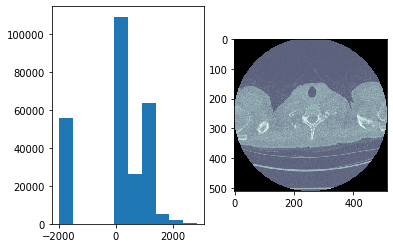

In [21]:
dicom = pydicom.read_file(base_dir + 'train/ID00007637202177411956430/1.dcm')
plt.subplot(121)
plt.hist(dicom.pixel_array.flatten());
plt.subplot(122)
plt.imshow(dicom.pixel_array, cmap=plt.cm.bone);

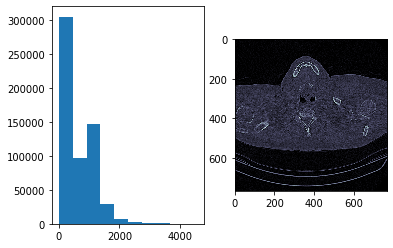

In [22]:
dicom = pydicom.read_file(base_dir + 'train/ID00009637202177434476278/1.dcm')
plt.subplot(121)
plt.hist(dicom.pixel_array.flatten());
plt.subplot(122)
plt.imshow(dicom.pixel_array, cmap=plt.cm.bone);

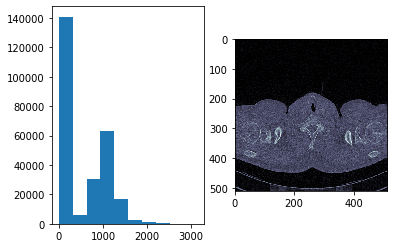

In [23]:
dicom = pydicom.read_file(base_dir + 'train/ID00010637202177584971671/1.dcm')
plt.subplot(121)
plt.hist(dicom.pixel_array.flatten());
plt.subplot(122)
plt.imshow(dicom.pixel_array, cmap=plt.cm.bone);

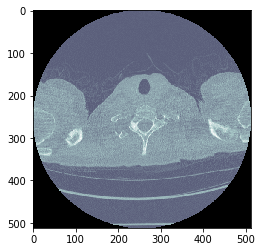

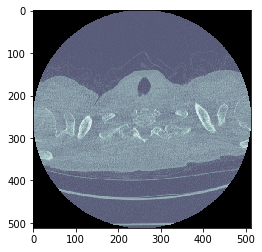

In [24]:
#plt.subplot(121)
dicom = pydicom.read_file(base_dir + 'train/ID00007637202177411956430/1.dcm')
plt.imshow(dicom.pixel_array, cmap=plt.cm.bone);
plt.show()
#plt.subplot(122)
dicom = pydicom.read_file(base_dir + 'train/ID00007637202177411956430/2.dcm')
plt.imshow(dicom.pixel_array, cmap=plt.cm.bone);
plt.show()

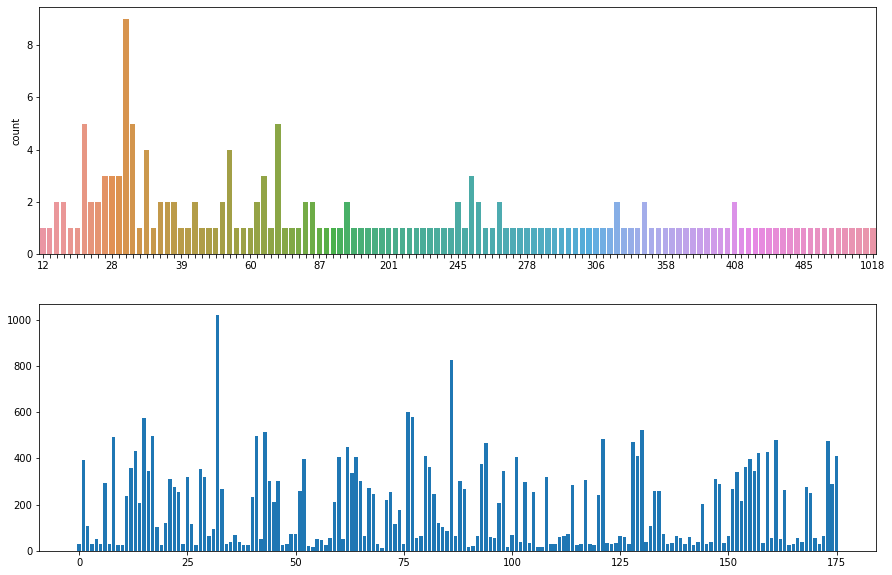

(12,
 1018,
 98.0,
 '187.6477',
 array([  30,  394,  106,   31,   49,   31,  295,   29,  493,   27,   24,
         239,  358,  433,  205,  574,  346,  497,  103,   26,  122,  311,
         275,  253,   30,  319,  118,   24,  355,  320,   64,   94, 1018,
         266,   30,   36,   70,   37,   24,   25,  233,  498,   53,  512,
         300,  211,  302,   24,   30,   71,   71,  258,  398,   22,   17,
          50,   48,   27,   57,  210,  407,   52,  451,  337,  404,  304,
          64,  271,  245,   28,   12,  221,  253,  115,  178,   31,  602,
         577,   56,   62,  408,  361,  245,  121,  102,   87,  825,   64,
         303,  268,   18,   21,   64,  375,  465,   58,   54,  207,  347,
          17,   67,  405,   38,  296,   33,  253,   18,   16,  319,   28,
          30,   61,   63,   74,  284,   25,   30,  306,   31,   26,  240,
         485,   35,   31,   33,   62,   61,   29,  469,  409,  521,   38,
         106,  258,  260,   74,   30,   33,   64,   56,   30,   60,   27,
      

In [25]:
slice_counts = np.array([
    len(os.listdir(f'{base_dir}/train/{directory}'))
    for directory in os.listdir(f'{base_dir}/train/')
])

plt.figure(figsize=(15, 10))
plt.subplot(211)
ax = sns.countplot(x=slice_counts)
for idx, label in enumerate(ax.get_xticklabels()):
    if idx % 10 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)
        
plt.subplot(212)
plt.bar(x=range(len(slice_counts)), height=slice_counts)
plt.show()


slice_counts.min(), slice_counts.max(), np.median(slice_counts), f'{slice_counts.mean():.4f}', slice_counts

## animate

In [89]:
patient_id = 'ID00007637202177411956430'

In [90]:
def load_scan(patient_id):
    files = [
        pydicom.read_file(i) for i in glob(base_dir + f'train/{patient_id}/*')
    ]
    
    # sort
    try:
        files.sort(
            key=lambda s: float(s.ImagePositionPatient[-1]))  # sort by z-axis
    except AttributeError:
        files.sort(key=lambda s: int(s.InstanceNumber))  # sort by z-axis
    
    # resize
    if files[0].pixel_array.shape[0] != 512:
        return np.concatenate(
            [cv2.resize(i.pixel_array, (512, 512))[None] for i in files])

    return np.concatenate([i.pixel_array[None] for i in files])


slices = load_scan(patient_id)
slices.shape

(30, 512, 512)

In [52]:
%%capture
# slices: from bottom to top

# gif
import imageio
imageio.mimsave("gif.gif", slices, duration=0.0001)

# video
fig = plt.figure()
ims = []
for image in slices:
    im = plt.imshow(image, animated=True, cmap=plt.cm.gray)
    plt.axis("off")
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=100)

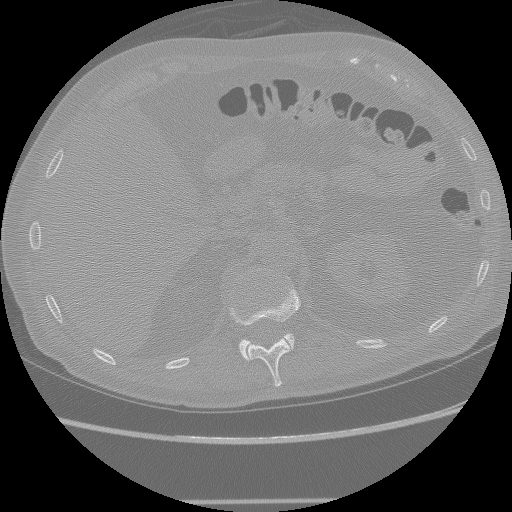

In [53]:
display.Image(filename="gif.gif", format='png')

In [54]:
display.HTML(ani.to_jshtml())

In [55]:
display.HTML(ani.to_html5_video())

## meta data

The meta elements in dcom files are `slightly different`

In [56]:
dicom

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 200
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 2.25.107800119032107514066474993240517588402
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.1
(0002, 0013) Implementation Version Name         SH: 'OSIRIX_361'
(0002, 0016) Source Application Entity Title     AE: 'ANONYMOUS'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008, 0018) SOP Instance UID                    UI: 2.25.107800119032107514066474993240517588402
(0008, 0060) Modality                            CS: 'CT'
(0008, 0070